In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy import stats
from sklearn.neighbors import KernelDensity
import matplotlib.colors as mcolors
from PIL import Image, ImageDraw
import warnings
warnings.filterwarnings("ignore")

In [2]:
kill_MIRAMAR=pd.read_csv('C:/Users/sun/Desktop/Univ/4_1/MediaProject/Project2/data_Kill_MIRAMAR.csv')

In [3]:
kill_MIRAMAR.head()

,killed_by,kill_by_type,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,kill_distance,kill_log_distance
0,M249,weapon,0932313woaini,7.0,529007.7,440035.5,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1209,GODusopp,11.0,526111.8,432951.8,7652.780050,3.883876
1,Kar98k,weapon,arunrunrun,6.0,440414.8,285918.1,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1096,TheOnly_0ne,13.0,438853.4,280981.6,5177.547895,3.714208
2,Down and Out,not_killed,Rabbit812,6.0,439923.2,282419.0,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1096,NOAIM1,13.0,437034.8,282477.7,2888.996409,3.460897
3,Down and Out,not_killed,0932313woaini,7.0,530312.4,440969.0,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1209,liweiliwei,11.0,528304.4,439696.8,2377.089994,3.376228
4,SCAR-L,weapon,sa11y1126,3.0,466609.2,409546.3,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1793,PKBskg,5.0,462901.5,403350.5,7220.455452,3.858625


In [4]:
miramar_img=Image.open('C:/Users/sun/Desktop/Univ/4_1/MediaProject/Project2/miramar.jpg')

In [5]:
#지도 이미지 크기와 위치 맵핑하기 쉽게 조정하기

def adjust_coordinate(df):
     coordinate_columns = ['victim_position_x', 'victim_position_y','killer_position_x', 'killer_position_y']
     df[coordinate_columns] = df[coordinate_columns] / 800000 * 4096
     return df

In [6]:
MIRAMAR_adj=adjust_coordinate(kill_MIRAMAR)

In [7]:
MIRAMAR_adj

,killed_by,kill_by_type,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,kill_distance,kill_log_distance
0,M249,weapon,0932313woaini,7.0,2708.519424,2252.981760,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1209,GODusopp,11.0,2693.692416,2216.713216,7652.780050,3.883876
1,Kar98k,weapon,arunrunrun,6.0,2254.923776,1463.900672,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1096,TheOnly_0ne,13.0,2246.929408,1438.625792,5177.547895,3.714208
2,Down and Out,not_killed,Rabbit812,6.0,2252.406784,1445.985280,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1096,NOAIM1,13.0,2237.618176,1446.285824,2888.996409,3.460897
3,Down and Out,not_killed,0932313woaini,7.0,2715.199488,2257.761280,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1209,liweiliwei,11.0,2704.918528,2251.247616,2377.089994,3.376228
4,SCAR-L,weapon,sa11y1126,3.0,2389.039104,2096.877056,MIRAMAR,2U4GBNA0YmkBbLEF24GGKLLAPoDQjAD8DoJFecsw9jUiNE...,1793,PKBskg,5.0,2370.055680,2065.154560,7220.455452,3.858625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1946979,Down and Out,not_killed,NaN,NaN,NaN,NaN,MIRAMAR,2U4GBNA0Ymm4XFTT0VP6nurXUaTAUNU6P9g6CzcuKI7zeS...,215,China-MC512,24.0,2444.259840,2793.134080,NaN,NaN
1946980,Kar98k,weapon,Faction_leader,1.0,3290.584064,2355.773952,MIRAMAR,2U4GBNA0Ymm4XFTT0VP6nurXUaTAUNU6P9g6CzcuKI7zeS...,150,yuihgyurig,27.0,3289.774592,2352.598016,640.131002,2.806947
1946981,M16A4,weapon,MASTERJIII,20.0,1285.784576,2692.336128,MIRAMAR,2U4GBNA0Ymm4XFTT0VP6nurXUaTAUNU6P9g6CzcuKI7zeS...,158,kkim11117,10.0,1279.936512,2701.068288,2052.644901,3.312525
1946982,SCAR-L,weapon,Yannyowns,5.0,1342.807552,2670.430720,MIRAMAR,2U4GBNA0Ymm4XFTT0VP6nurXUaTAUNU6P9g6CzcuKI7zeS...,894,xing950524,10.0,1344.389632,2668.099584,550.253660,2.741351


In [8]:
#컬러맵 만들기
reds_color = np.zeros((100, 4))
reds_color[:, 0] = np.linspace(0, 1, 100)
reds_color[:, 3] = np.linspace(0.4, 1, 100)
reds_color[:10] = 0
alpha_reds_cmap = mcolors.LinearSegmentedColormap.from_list('alpha_reds', colors=reds_color, N=1024, gamma=1)

greens_color = np.zeros((100, 4))
greens_color[:, 1] = np.linspace(0, 1, 100)
greens_color[:, 3] = np.linspace(0.4, 1, 100)
greens_color[:10] = 0
alpha_greens_cmap = mcolors.LinearSegmentedColormap.from_list('alpha_greens', colors=greens_color, N=1024, gamma=1)

In [9]:
#히트맵 그리기

def draw_heatmap(df,img,bw,cmap):
    x_mesh = np.linspace(0, 4096, 100)
    y_mesh = np.linspace(0, 4096, 100)
    X, Y = np.meshgrid(x_mesh, y_mesh)
    xy = np.vstack([X.ravel(), Y.ravel()]).T

    kde = KernelDensity(kernel='epanechnikov', bandwidth=bw).fit(df.to_numpy())
    log_density = kde.score_samples(xy)
    log_density = log_density.reshape((100, 100))
    density = np.exp(log_density)
    
    fig, ax = plt.subplots(figsize=(16, 16))

    plt.gca().invert_yaxis()
    ax.contourf(X, Y, density, alpha=None, cmap=cmap)
    ax.imshow(img, aspect='auto', extent=[0,4096,4096,0])
    return fig, ax

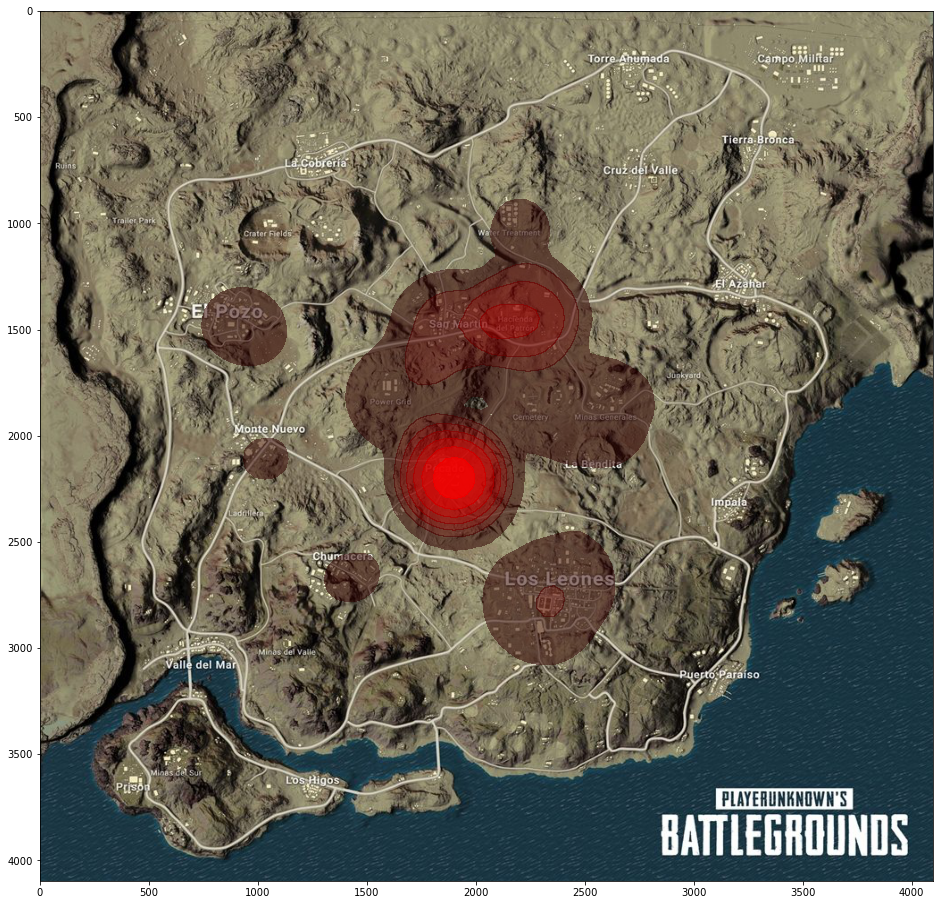

In [10]:
#미라마 맵에서 죽은 유저들의 위치 분포 확인
ax=draw_heatmap(MIRAMAR_adj[['victim_position_x','victim_position_y']],miramar_img,300, alpha_reds_cmap)

In [11]:
ax[0].savefig('miramar_total_victim_position.jpg')

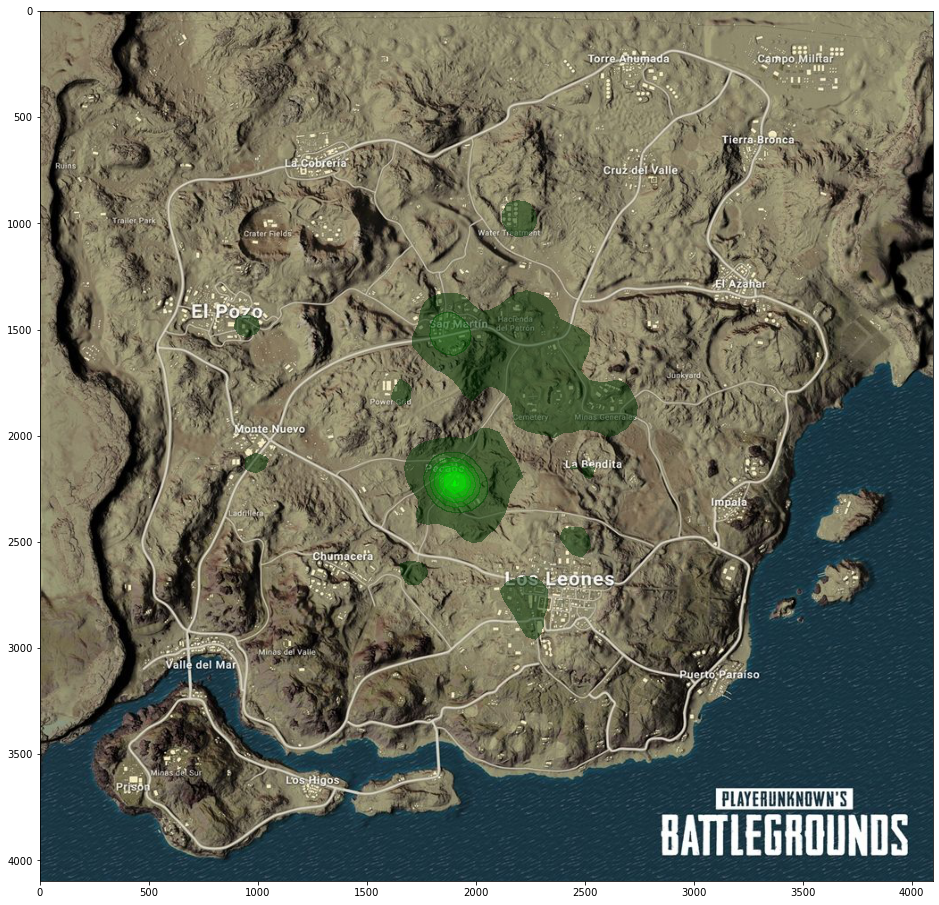

In [15]:
#미라마 맵에서 킬 거리 상위 20퍼센트 킬러들의 킬 위치 분포

longdistance_MIRAMAR=MIRAMAR_adj[MIRAMAR_adj['kill_distance']>MIRAMAR_adj['kill_distance'].quantile(0.8)]

ax=draw_heatmap(longdistance_MIRAMAR[['killer_position_x','killer_position_y']],miramar_img,130, alpha_greens_cmap)

In [16]:
ax[0].savefig('miramar_long_killer.jpg')

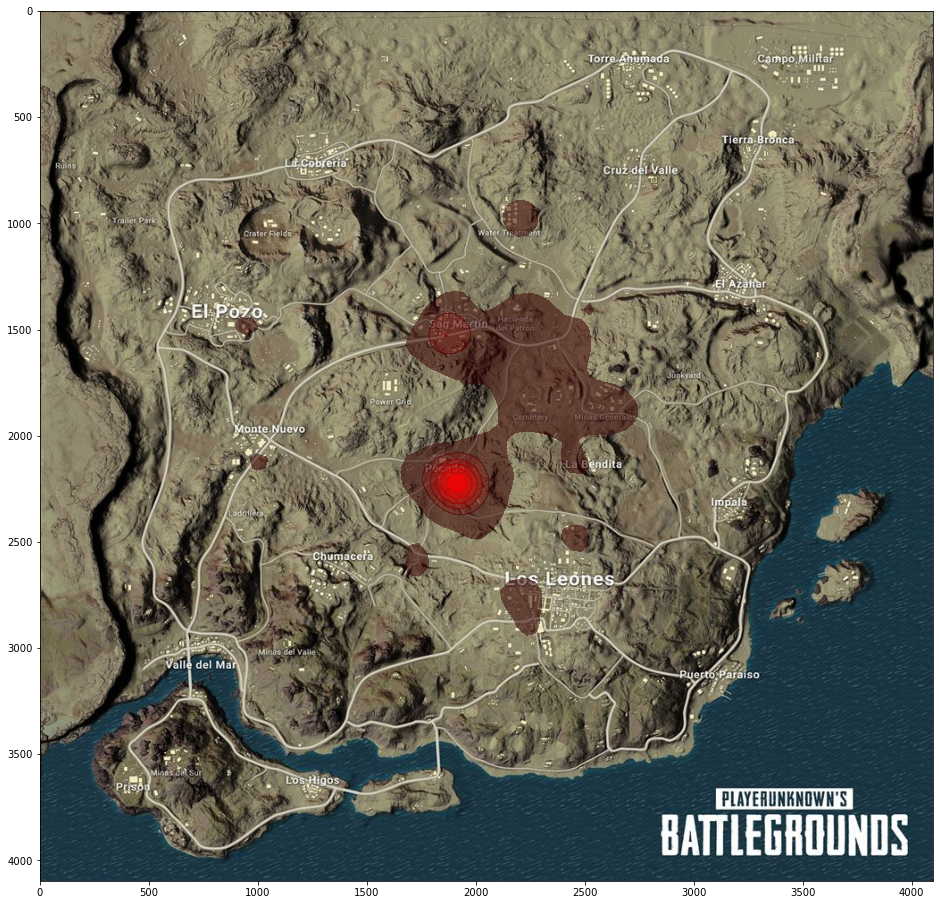

In [17]:
#미라마 맵에서 킬 거리 상위 20퍼센트 킬러들에 의해 죽은유저들의 위치 분포

ax=draw_heatmap(longdistance_MIRAMAR[['victim_position_x','victim_position_y']],miramar_img,130, alpha_reds_cmap)

In [18]:
ax[0].savefig('miramar_long_victim.jpg')

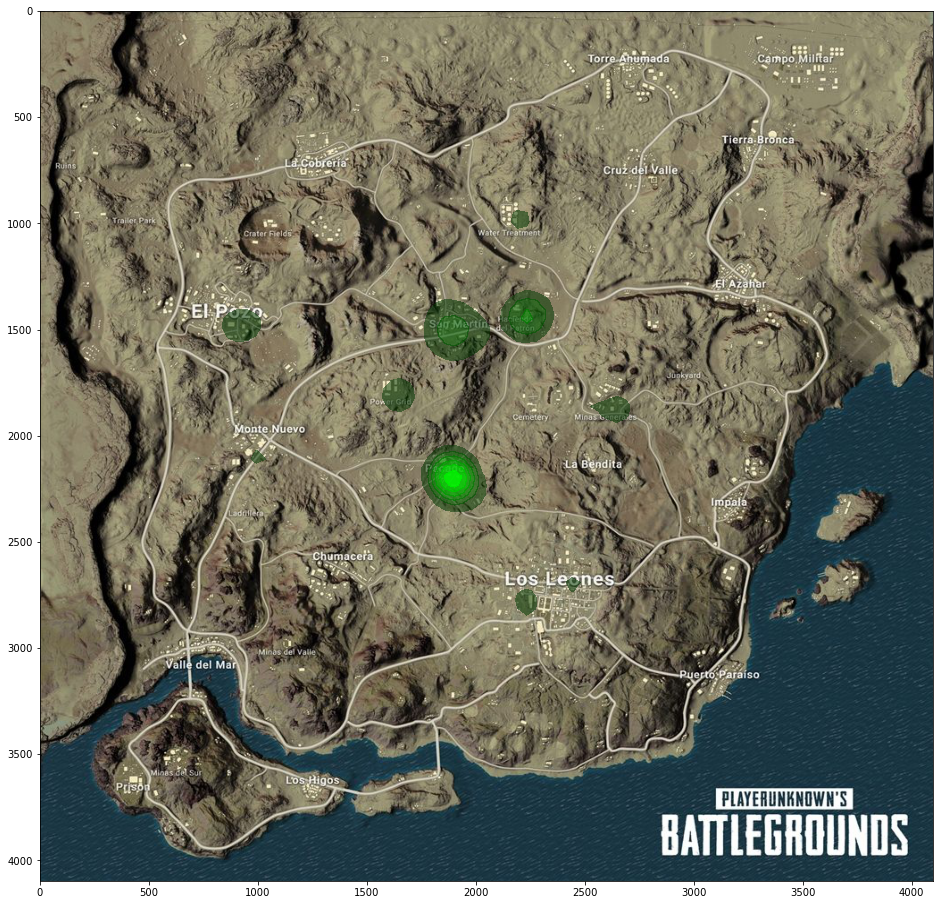

In [20]:
#미라마 맵에서 등수 10등 이내의 킬러들의 킬 위치 분포

top_killer_MIRAMAR=MIRAMAR_adj[MIRAMAR_adj['killer_placement']<=10]

ax=draw_heatmap(top_killer_MIRAMAR[['killer_position_x','killer_position_y']],miramar_img,130,alpha_greens_cmap)

In [21]:
ax[0].savefig('miramar_top_killer.jpg')